# 🐶 End-to-End Multi-classs dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. problem
   
Identifying the breed of the dog given an image of it.

## 2. Data

We are using dataset from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file of prediction probabilitie for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

some information about the data:
  
  * We're dealing with image (unstructured data).
  * There are 120 breeds of dogs in the dataset.
  * Training set contains 10,000+ images (with label).
  * Test set contains 10,000+ images (No labels).

In [8]:
# Mounting Google Drive to access data.
#from google.colab import drive
#drive.mount('/content/drive')

## Getting our workspace ready

In [9]:
# Importing Tensor Flow into colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [10]:
# importing Tensorflow Hub
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

TF Hub version: 0.16.1


In [ ]:
import tf_keras

In [11]:
# Check for GPU
print("GPU", "available (Yes!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


## Getting our data ready (Turning into tensors)

> Converting images into numbers for machine learning models.




In [12]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

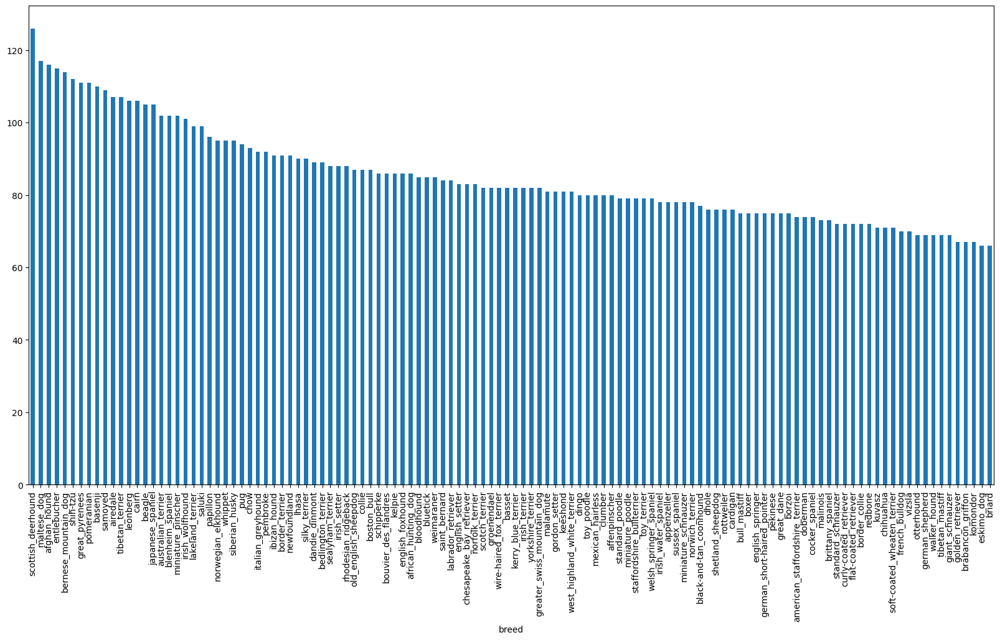

In [13]:
# Count of each breed of dog image
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [14]:
labels_csv["breed"].value_counts().median()

82.0

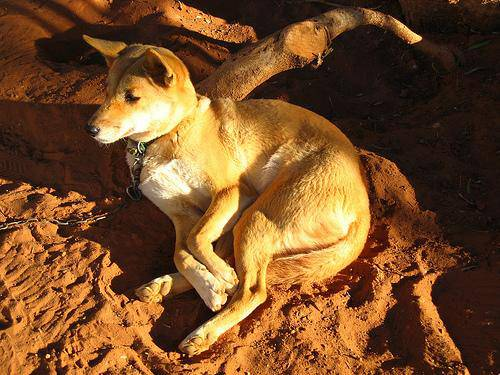

In [15]:
# Checking image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels
Getting list of all image files and pathnames.

In [16]:
# Creating pathnames from image's ID's
filenames = ["drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [17]:
# another method of file path joining
# train_files = [os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/train/", x) for x in labels_csv["id"]]

In [18]:
len(filenames)

10222

In [19]:
import os
# Creating base directory for next cell of code
base_dir = "drive/MyDrive/Dog Vision/dog-breed-identification/train/"
train_files = os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")

In [20]:
# removing redundant data
for f in train_files:
  if '(' in f:
    os.remove(os.path.join(base_dir, f))

In [21]:
len(train_files)

10222

In [22]:
# Checking whether numbers of filenames matches actual number of images
import os
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Yes it matches")
else:
  print("No there is something wrong")

Yes it matches


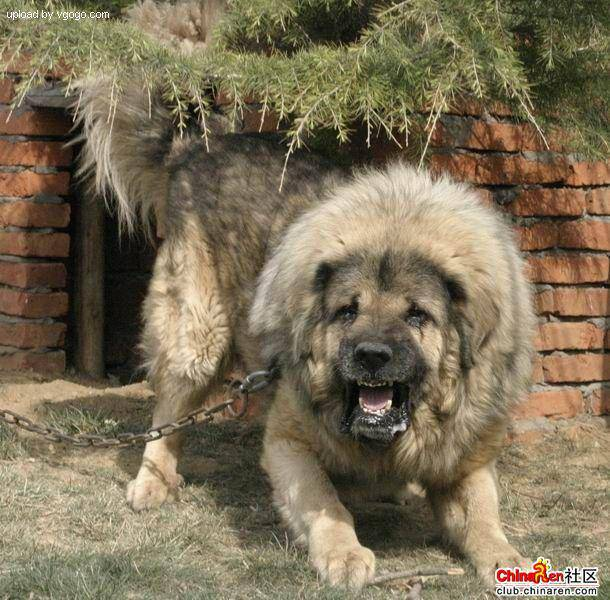

In [23]:
# Checking our file path list
Image(filenames[9000])

### Preparing our labels

In [24]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [25]:
# Checking missing labels
if len(labels) == len(filenames):
  print("No missing labels")
else:
  print("Missing labels")

No missing labels


In [26]:
# Numbers of unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [27]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [28]:
# Turning data labels into booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [29]:
# Turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [30]:
len(boolean_labels)

10222

In [31]:
# Turning boolean arrays into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation sets
There is no validation set in our dataset

In [32]:
# Setup x and y
x = filenames
y = boolean_labels

### We are going to work with 1000 images at a time for experiments

In [33]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [34]:
# Split data into train and validation
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)


### Preprocessing Images (turning into Tensors)
1. Using tensorflow to read image file and saving to variable `image`
2. Turning `image` into Tensors
3. Normalize image ( changing color channel vakue from 0-255 to 0-1)
4. Resize all image to (224, 224)

In [35]:
# Defining image size
IMG_SIZE = 224

# Preprocessing image
def process_image(image_path):
   # read image from pat and turn into string tensor
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values ( normalizaton )
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning images into batches
Batch size (32 images)

Tensor tuples = `(image, label)`

In [36]:
# Creating function to return a tuple
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [37]:
# Demo of above
(process_image(x[42]), tf.constant(y[42])) #turning label into tensor

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [38]:
# Turning all our data onto batches with funtion
BATCH_SIZE = 32
def create_data_batches(x, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data
  Accepts test data as input (no labels).
  """
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # We don't need to shuffle valid datasets
  elif valid_data:
    print("Creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch = data.map(lambda x, y: (process_image(x), y)).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling data
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples ( this also turn image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [39]:
# Creating trainig and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches..


In [40]:
# Checking the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data batches

In [41]:
import matplotlib.pyplot as plt
# Creating function for viewing images in a data batch
def show_25_images(images, labels):
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 images
  for i in range(25):
    # creating subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Displaay an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turnoff gridlines
    plt.axis("off")

In [42]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [43]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.50525230e-01, 2.87780136e-01, 1.54446781e-01],
          [3.49614859e-01, 2.75105059e-01, 1.45693287e-01],
          [3.45413178e-01, 2.74194688e-01, 1.33333340e-01],
          ...,
          [4.58823562e-01, 3.68627459e-01, 2.03921586e-01],
          [4.69634145e-01, 3.71594906e-01, 2.14732155e-01],
          [4.69634145e-01, 3.71594906e-01, 2.14732155e-01]],
 
         [[3.47662836e-01, 2.84917742e-01, 1.51584387e-01],
          [3.46752465e-01, 2.72242665e-01, 1.42830893e-01],
          [3.45643193e-01, 2.74424702e-01, 1.33563355e-01],
          ...,
          [4.61685956e-01, 3.71489853e-01, 2.06783980e-01],
          [4.66666698e-01, 3.68627459e-01, 2.11764723e-01],
          [4.66666698e-01, 3.68627459e-01, 2.11764723e-01]],
 
         [[3.41832995e-01, 2.79087901e-01, 1.45754561e-01],
          [3.44248950e-01, 2.69739151e-01, 1.40327394e-01],
          [3.45728308e-01, 2.74509817e-01, 1.33648470e-01],
          ...,
          [4.67515796e-01, 3.77319723e-01, 2.1261

In [44]:
len(train_images), len(train_labels)

(32, 32)

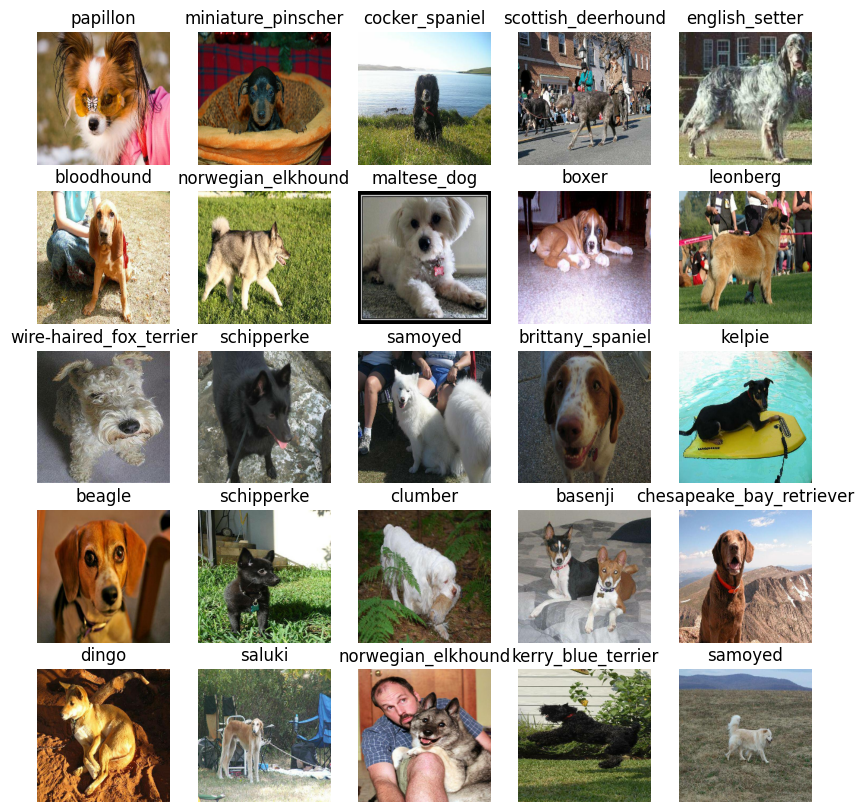

In [45]:
# let's vizualize the data in a training batch
show_25_images(train_images, train_labels)

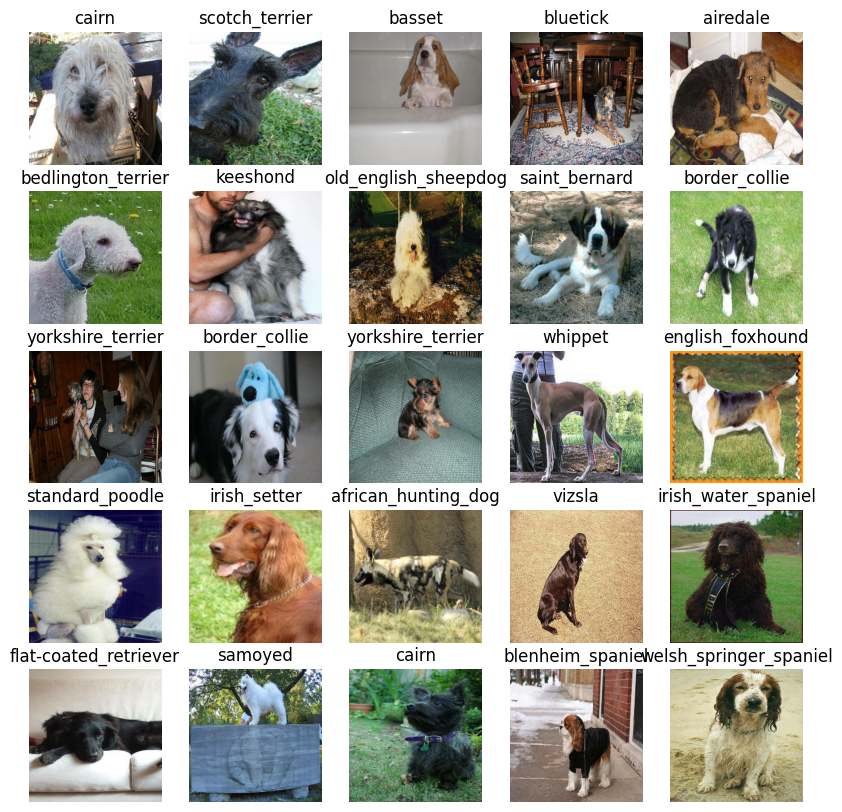

In [46]:
# Let's visualize validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
We need to define the following:
* The `input` shape (our image shape, in form of tensors)
* The output shape (image labels, in form of tensors)
* The URL of model we want to use. https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-feature-vector/1


In [47]:
# Setting up input shape for our model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# Setting up our output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup MOdel URL from tensorflow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-feature-vector/1"

Let's  put everything together into a Keras deep learning model!
Creating a function which:
* Takes the input shape, output shape and the model as parameter.
* Defines the layers into Keras model in sequential fashion.
* Compiles the model (should be evaluated and improved).
* Builds the model (tells the model the input shape it would be getting).
* Returns the model.

In [48]:
# Creates a function to build a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", MODEL_URL)

    # Setup the model layers
    model = tf_keras.Sequential([
        hub.KerasLayer(MODEL_URL),  # Layer 1 (Input layer)
        tf_keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")  # Layer 2 (Output Layer)
    ])

    # Compile the model
    model.compile(
        loss=tf_keras.losses.CategoricalCrossentropy(),
        optimizer=tf_keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)
    return model

In [49]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-feature-vector/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2731616   
                                                                 
 dense (Dense)               (None, 120)               153720    
                                                                 
Total params: 2885336 (11.01 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2731616 (10.42 MB)
_________________________________________________________________


## Creating callbacks
We will create two callbacks, one for TensorBoard which helps saving progress and another for early stopping from training too long.


### TensorBoard callback

In [50]:
# Load TensorBoard
%load_ext tensorboard

In [51]:
# Create TensorBoard Callback
import datetime

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard (logdir)

### Early Stopping Callback

In [52]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training our model (on subset of 1000 images)

In [53]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [54]:
# Check for GPU
print("GPU", "available (Yes!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


In [55]:
# Building a function to train model and return it
def train_model():
    # Create a model
    model = create_model()

    # Create a new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])
    # Return the model
    return model

In [56]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-feature-vector/1
Epoch 1/100
25/25 [==============================] - 249s 10s/step - loss: 4.4821 - accuracy: 0.0988 - val_loss: 3.9508 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 39s 2s/step - loss: 2.8968 - accuracy: 0.6112 - val_loss: 3.1391 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 36s 1s/step - loss: 1.7641 - accuracy: 0.8512 - val_loss: 2.5370 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 39s 2s/step - loss: 1.0513 - accuracy: 0.9362 - val_loss: 2.1415 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 37s 1s/step - loss: 0.6503 - accuracy: 0.9712 - val_loss: 1.9205 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 40s 2s/step - loss: 0.4314 - accuracy: 0.9862 - val_loss: 1.7871 - val_accuracy: 0.6150
Epoch 7/100
25/25 [===================

#### Model is overfitted

#### Checking TensorBoard log with (`%tensorboard`)and vizualizing it's content

In [57]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [58]:
# Making predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 16s 838ms/step


array([[1.97171187e-03, 1.30431110e-03, 9.65668180e-04, ...,
        9.69346904e-04, 1.43768720e-03, 1.57919899e-03],
       [2.60534417e-03, 7.59979524e-03, 6.70342613e-03, ...,
        1.06519402e-03, 6.38331240e-03, 4.36835311e-04],
       [1.20284734e-04, 3.35738732e-05, 2.51287456e-05, ...,
        2.75579863e-04, 7.18408482e-05, 4.09855165e-05],
       ...,
       [2.19806956e-04, 5.97925624e-04, 7.91397528e-04, ...,
        2.98071449e-04, 2.64319067e-04, 5.88722469e-04],
       [1.29898847e-03, 4.90583014e-04, 1.39974710e-03, ...,
        1.53484929e-03, 1.42037973e-03, 4.24948428e-03],
       [1.71791995e-03, 2.30663898e-03, 3.10104317e-03, ...,
        5.57004334e-03, 3.02897370e-03, 2.32470152e-03]], dtype=float32)

In [59]:
np.sum(predictions[0])

1.0

In [60]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.85212009e-04 3.28434369e-04 5.83881105e-04 6.33547024e-04
 4.35547379e-04 7.98982655e-05 6.83029823e-04 1.37005595e-03
 3.93777862e-02 2.34100502e-02 4.75872017e-04 1.52156077e-04
 3.96523887e-04 2.29142047e-03 5.70811506e-04 1.00362180e-02
 1.34929505e-04 3.92163725e-04 3.56542732e-04 1.15915303e-04
 2.01392861e-04 3.22383014e-04 5.61003071e-05 2.06337907e-04
 7.41037400e-03 7.97634420e-05 2.60302157e-04 8.19725319e-05
 3.07091832e-04 2.91335338e-04 5.81257336e-05 1.83707059e-04
 1.80904492e-04 5.79246960e-04 4.73939726e-04 1.46649094e-04
 5.39289438e-04 1.24675792e-03 2.15522159e-04 6.85499549e-01
 7.30023661e-04 1.20187120e-04 3.57509707e-03 9.91676643e-05
 1.22464713e-04 1.69015490e-04 6.77540957e-04 1.42963382e-03
 2.62128044e-04 4.04185412e-04 3.06111848e-04 8.28076809e-05
 2.28754274e-04 1.21373171e-03 3.15010082e-04 8.74140183e-04
 1.40023520e-04 5.21648268e-04 3.64637264e-04 4.82801319e-04
 1.81043069e-04 5.15694323e-04 3.12710443e-04 2.64448736e-05
 5.35089348e-04 1.524270

In [61]:
# turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Getting prediction label
pred_label = get_pred_label(predictions[81])
pred_label

'basset'

Now since our val_data is still in batch dataset, we will have to unbatch it to make prediction on them and then compare to their respective labels

In [62]:
## Unbatch the validation dataset
def unbatchify(data):
  """
  Takes the batch of (image, label) dataset and return separate arrays of images
  and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the val_data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Lets vizualize the data we have gathered:
* Prediction labels
* Validation labels
* Validation images

In [63]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  view the prediction, ground truth and images for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of title depending on right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # changing title to predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

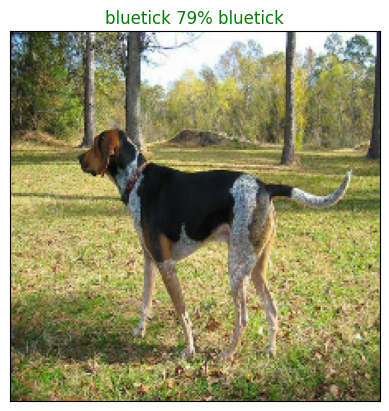

In [64]:
import random # to select random value od val_data
plot_pred(prediction_probabilities = predictions,
          labels=val_labels,
          images=val_images,
          n=random.randint(1, 200))

Now we will build a function to view top 10 predictions for an image,
This will contain:
* Take input of prediction probabilities array and a ground truth array and a integer
* Find prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

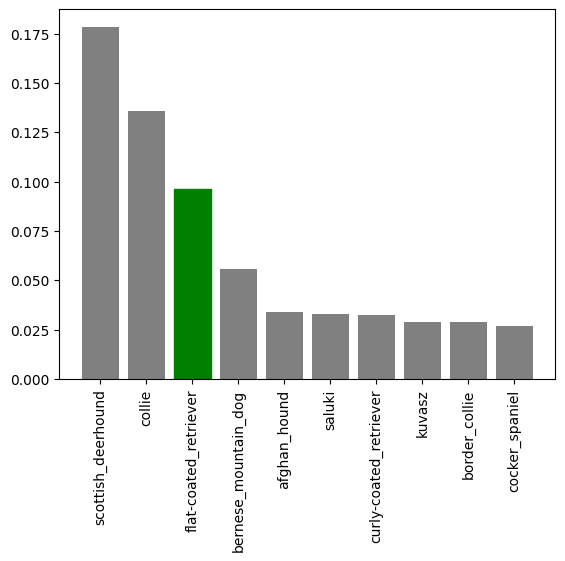

In [66]:
import random
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n = random.randint(1, 200))

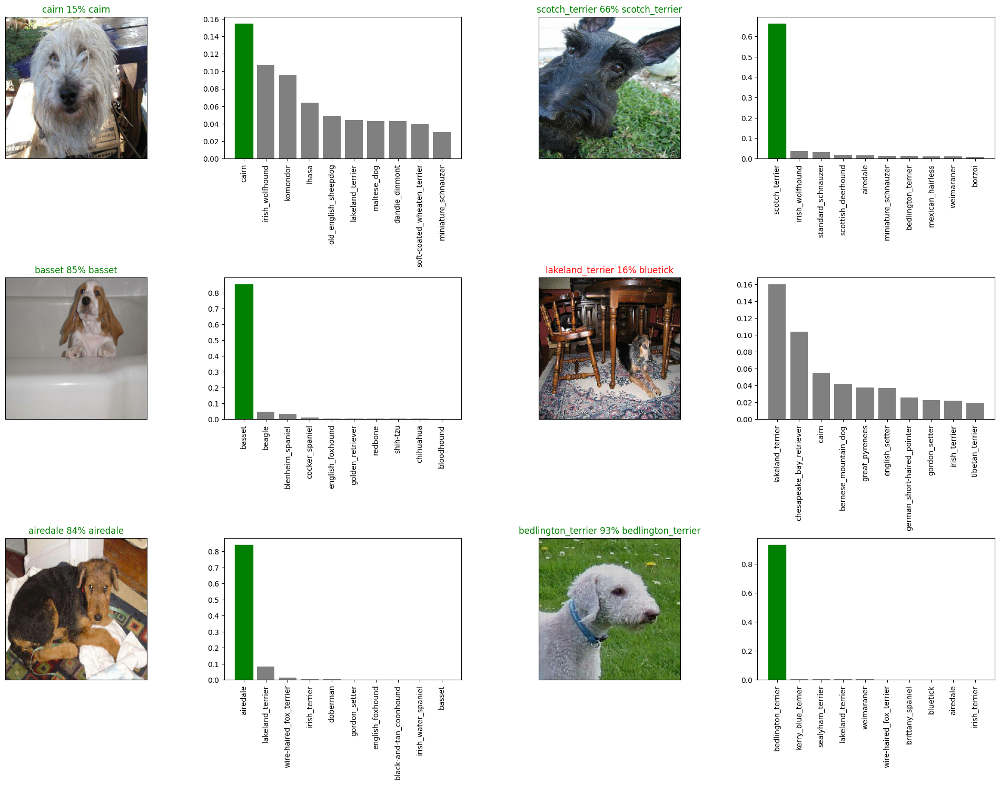

In [67]:
# Let's checkout few predictions and their different values
i_multiplier =0
num_rows =3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model



In [68]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [69]:
 # Building function to load a trained model
 def load_model(model_path):
  """
  Load a saved model from a specified path
  """
  print(f"Loding saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [70]:
# save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv3-Adam")

Saving model to : drive/MyDrive/Dog Vision/dog-breed-identification/models/20240516-032433-1000-images-mobilenetv3-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/dog-breed-identification/models/20240516-032433-1000-images-mobilenetv3-Adam.h5'

In [71]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/dog-breed-identification/models/20240515-180756-1000-images-mobilenetv3-Adam.h5')

Loding saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240515-180756-1000-images-mobilenetv3-Adam.h5


In [72]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 7s 948ms/step - loss: 1.5139 - accuracy: 0.6300


[1.5139120817184448, 0.6299999952316284]

In [73]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 5s 578ms/step - loss: 1.6109 - accuracy: 0.6300


[1.610910177230835, 0.6299999952316284]

## Training a model on the full data

In [74]:
len(x), len(y)

(10222, 10222)

In [75]:
# create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [76]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a mode for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-feature-vector/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 56s 148ms/step - loss: 1.7503 - accuracy: 0.6405
Epoch 2/100
320/320 [==============================] - 44s 136ms/step - loss: 0.5681 - accuracy: 0.8531
Epoch 3/100
320/320 [==============================] - 59s 184ms/step - loss: 0.3715 - accuracy: 0.9068
Epoch 4/100
320/320 [==============================] - 46s 143ms/step - loss: 0.2610 - accuracy: 0.9450
Epoch 5/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1891 - accuracy: 0.9652
Epoch 6/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1437 - accuracy: 0.9805
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1095 - accuracy: 0.9885
Epoch 8/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0874 - accuracy: 0.9929
Epoch 9/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0694 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 47s 145m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv3-Adam")

Saving model to : drive/MyDrive/Dog Vision/dog-breed-identification/models/20240515-185416-full-image-set-mobilenetv3-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/dog-breed-identification/models/20240515-185416-full-image-set-mobilenetv3-Adam.h5'

In [7]:
# load in full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/dog-breed-identification/models/20240515-185416-full-image-set-mobilenetv3-Adam.h5')

Loding saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240515-185416-full-image-set-mobilenetv3-Adam.h5


## Making prediction on test datasets
We will first convert our test data into batches as our model has been trained on data batches.
We will do the following:
* Get the test image filenames.
* Convert the filenamesinto test data batches using `create_data_batches()` and setting `test_data` parameter to `True` as test data don't have labels.
* Make a prediction array by passing the test batches to the predict() method.

In [78]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/test/e83f4c0ff6dec86d89d0f8b70ecd3cea.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e8e42d4a1a18d4168bac9a69922df22f.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e807c4b5025b0aa4dcbd5df2765aa8e4.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e8d27c76d6921b27aea1e2da6920396f.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e8d5c81029e17c81b06af60ec4113b30.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e8763575a23f1e1a86788b82bd105f07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e89317cab9060dcaa19f1b669d363223.jpg']

In [79]:
len(test_filenames)

10397

In [80]:
# Create test databatch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches..


In [81]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [82]:
# Make predictions in test data
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

325/325 [==============================] - 2009s 6s/step


In [84]:
np.savetxt("drive/MyDrive/Dog Vision/dog-breed-identification/preds_array.csv", test_predictions, delimiter=",")

In [85]:
test_predictions[:10]

array([[1.39908316e-08, 2.20016858e-08, 6.57043202e-08, ...,
        1.27179732e-07, 5.28667078e-06, 1.03407629e-07],
       [3.81647880e-07, 3.29346835e-06, 1.87624948e-07, ...,
        2.49011443e-08, 2.20014286e-07, 2.89143873e-06],
       [1.97233767e-08, 2.45841852e-06, 1.90441970e-05, ...,
        1.18026193e-08, 1.47224792e-08, 2.51941401e-07],
       ...,
       [9.95483163e-08, 1.52637931e-05, 5.13494888e-06, ...,
        1.03228729e-06, 5.54405744e-07, 6.74392368e-07],
       [1.86962973e-06, 1.13577028e-06, 4.56259777e-08, ...,
        5.37009055e-06, 7.86687565e-07, 2.88353681e-06],
       [2.01090469e-08, 7.57159526e-08, 1.23991075e-08, ...,
        8.52385451e-09, 2.71955027e-08, 8.78179218e-09]], dtype=float32)

## Preparing test dataset preditions for kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [86]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [87]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [88]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e83f4c0ff6dec86d89d0f8b70ecd3cea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7dc8cc599049ea9fa2a172c88646c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e8e42d4a1a18d4168bac9a69922df22f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7fcdf9671a6593b638cbee42842f981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e807c4b5025b0aa4dcbd5df2765aa8e4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e83f4c0ff6dec86d89d0f8b70ecd3cea,1.399083e-08,2.200169e-08,6.570432e-08,2.774673e-07,2.464872e-07,1.611148e-06,4.592219e-06,9.362782e-05,4.487181e-07,...,1.802805e-08,2.993181e-07,8.240284e-09,5.612650e-08,2.002076e-09,2.110569e-06,1.521700e-07,1.271797e-07,5.286671e-06,1.034076e-07
1,e7dc8cc599049ea9fa2a172c88646c57,3.816479e-07,3.293468e-06,1.876249e-07,1.177257e-07,1.037035e-07,1.110460e-07,5.125728e-06,2.684406e-07,2.290266e-09,...,1.455341e-06,2.329721e-07,7.247203e-08,8.880675e-07,1.741504e-07,5.763261e-07,1.830337e-07,2.490114e-08,2.200143e-07,2.891439e-06
2,e8e42d4a1a18d4168bac9a69922df22f,1.972338e-08,2.458419e-06,1.904420e-05,2.215102e-07,3.465469e-09,1.016322e-06,8.271908e-07,1.470847e-09,3.406498e-07,...,4.849861e-08,2.489054e-08,1.240544e-07,7.450438e-09,6.069575e-08,9.449595e-06,5.379554e-07,1.180262e-08,1.472248e-08,2.519414e-07
3,e7fcdf9671a6593b638cbee42842f981,1.652650e-08,2.780251e-07,1.317130e-07,2.198702e-06,5.909048e-07,1.433164e-07,3.223041e-09,2.382379e-07,7.912931e-08,...,8.445500e-09,2.668137e-07,6.507991e-09,1.116947e-07,1.689026e-09,9.785562e-01,1.084793e-06,4.327751e-07,1.252280e-06,8.446789e-07
4,e807c4b5025b0aa4dcbd5df2765aa8e4,5.340335e-10,9.517527e-10,2.764525e-08,2.584069e-09,3.992739e-09,2.832249e-08,2.825401e-09,1.163894e-09,4.724858e-08,...,1.056414e-08,4.237007e-09,1.995625e-10,5.149321e-06,2.098478e-10,2.414073e-08,1.552951e-09,9.068485e-09,6.678473e-09,3.669305e-10


In [91]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/dog-breed-identification/full_model_predictions_submission_1_mobilenetV3.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [95]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/dog-breed-identification/sample photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [96]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches..


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [97]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 187ms/step


In [99]:
custom_preds.shape

(4, 120)

In [100]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['border_collie', 'papillon', 'german_shepherd', 'shetland_sheepdog']

In [101]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

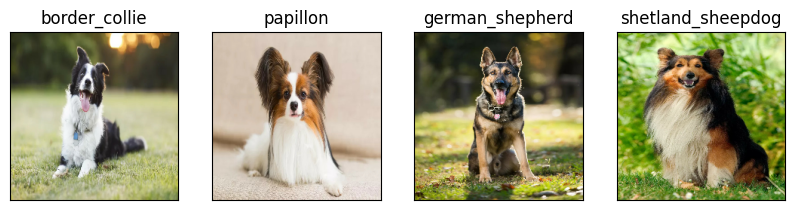

In [103]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)